In [1]:
# Copyright 2020 Fabian Hofmann
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Generative Adversarial Network for Video

This is a (from scratch) modified implementation of the VGAN structure proposed by Vondrick et al. [\[1\]](http://www.cs.columbia.edu/~vondrick/tinyvideo/), run on our own created video dataset [\[2\]](https://gitlab.tubit.tu-berlin.de/sulandir/thesis_data). The paper author's code is unusable due to written in LUA and Torch and there are differences in the actual implementations that is linked by the authors and original paper. Parameters and the general structure of the models were extracted from the sources, but then heavily modified (to fit our data format), while also preserving the original idea of the paper.

The code below mimics the DCGAN implementation by TensorFlow [\[3\]](https://www.tensorflow.org/tutorials/generative/dcgan) in structure (and sometimes even in code, when noted). Reason being these ideas are extremely similar (image vs video generation), and most of the workflow to build and train such models is very much the same.

## Setup

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

tf.__version__

'2.1.0'

In [3]:
if tf.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print("Please install GPU version of TF")

Default GPU Device: /device:GPU:0


In [4]:
import numpy as np
import os
import time

from IPython import display
from matplotlib import pyplot as plt

# git+https://github.com/tensorflow/docs
import tensorflow_docs.vis.embed as embed

from src.io_.batch_generator import UniformBatchGenerator, BatchLoader
from src.io_.gif_writer import write_gif, write_gif_grid

In [5]:
base_input_path = "../../data/upCam/preprocessed_128_64/"
base_output_path = "../../output/models/vgan/vgan/"

## Instantiate and test the batch generator

The discriminator is trained on ~1.5 second (8 frames) long video clips, sampled from the created video dataset. This way, the generator will learn to generate videos resembling these videos.

The BatchGenerator will be later (at the training step) wrapped in a BatchLoader to allow concurrent loading of data from the generator while the model trains, so there is nothing to be done except instantiating the generator.

In [6]:
# Required for the training_step later
BATCH_SIZE = 64

In [7]:
days = ["00", "01", "02", "03", "04"]
day_paths = [base_input_path + day + "/" for day in days]

uniform_sampler = UniformBatchGenerator(day_paths=day_paths, batch_size=BATCH_SIZE, sample_size=8, subsample_size=1)

Get first batch from the batch generator to check if the shapes and types are in order. For `train_x` that are images, the shape is wrong (there is one redundant dimension, time). This dimension can be later removed by reshaping the input, either with numpy (preprocessing) or via the network (tf.reshape).

Samples are already normalized to`[-1,1]`by the generator.

In [8]:
train_x, train_y = uniform_sampler[0]

assert np.shape(train_x) == (64, 1, 64, 128, 3) # (samples, frames, height, width, channels)
assert np.shape(train_y) == (64, 8, 64, 128, 3) # (samples, frames, height, width, channels)

Display one of the video clips (as GIF).


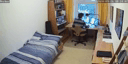

In [9]:
anim_file = base_output_path + "anim/test_clip.gif"

write_gif(anim_file, train_y[60], fps=5)
embed.embed_file(anim_file)

We also to created a helpful function to view multiple video clips at once. This will later be used to check on the model during training and how the generated videos evolve.


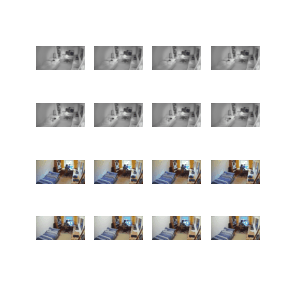

In [10]:
anim_file_grid = base_output_path + "anim/test_clip_grid.gif"

write_gif_grid(anim_file_grid, train_y[::4], fps=5)
embed.embed_file(anim_file_grid)

## Create the models

Models are created using the [Keras Function API](https://www.tensorflow.org/guide/keras/functional).

### The Generator

The generator uses `tf.keras.layers.Conv3DTranspose` to upsample a seed (100 dimensional gaussian noise) until a video of a desired width, height and length is generated. Unlike a normal upsampling network, the VGAN structure proposed by Vondrick et al. [\[1\]](http://www.cs.columbia.edu/~vondrick/tinyvideo/) splits the network into two streams (see the image below): The contents of a video are split into a static background and a dynamic foreground stream, that is put on the background.

Parameters are similar to the ones described by Vondrick et al.; see figure below for the general idea. In the original paper and their [code](https://github.com/cvondrick/videogan), the following other parameters were set:
- All weights are initialized with Gaussian noise (`mean=0`, `sd=0.01`).
- The fractionally strided convolutions use a kernel size of `4` and stride size of `2`, except in the first layer. There a stride of `2x4x4` and `4x4` is applied for foreground and background stream respectively (with kernel size `1`).
- After every layer, batch normalization and ReLU activation functions are applied, except the output layers (they use either tanh or sigmoid without batch normalization).
- A small sparsity prior is added on the mask; it is an L1 activity regularization penalty with `l=0.1` to encourage the use of the background stream.
- Besides the background stream, that is replicated across the time dimension (see below), singleton dimensions (mask m) are also replicated to match.

![generator](http://www.cs.columbia.edu/~vondrick/tinyvideo/network.png)

However, instead of `32x64x64` format of output data, we are dealing with `8x64x128`. This results in less total pixels needing to be generated for the final space-time cuboid. But this does not decrease the complexity for the background stream, because it uses fractionally-strided spatial convolutions (2D), quite the contrary. So the following adjustments were made, taking into account both the loss and increase of complexity of the foreground and background stream, respectively:
- Instead of reshaping the input and feeding it directly into the first convolution, one dense layer (for each stream) upsamples the input to the size of the first convolution instead of the convolutional layer itself (therefore only needing stride `1`, but keeping a kernel size greater a value greater than `1`).
- One additional upsampling layer (2D/3D convolution) is added to each stream.
- The size of the time dimension is only doubled every second layer (stride of `1x2x2` when not upsampling time in current step).
- For the other two dimension (width, height), `2x4` was chosen as their input size, upsampling them to `64x128`.
- The fractionally strided convolutions use a kernel size of `3` instead of `4` because even kernels lead to distortions. This is applied on all convolutional layers.

In addition, for the layers that use the ReLU activation functions, the weight initialization was changed to `tf.keras.initializers.HeNormal` instead of `tf.keras.initializers.GlorotUniform`. This helps with the quality and the convergence speed [\[2\]](https://www.cv-foundation.org/openaccess/content_iccv_2015/html/He_Delving_Deep_into_ICCV_2015_paper.html).

#### Foreground Stream

The foreground stream of the VGAN generator is a pathway of fractionally-strided spatio-temporal convolutions, that is generated by upsampling from the input noise. It is assumed that only objects move and that videos are recorded by a static camera, so the foreground stream exclusively models the object motion in the video.

The foreground stream of the generator model consists of two parts: The actual moving foreground (a spatio-temporal cuboid) and the spatio-temporal mask, that selects/deselects pixels of foreground and background, so moving objects do not overlap parts of the back ground when foreground and background are merged together at the end.

In [11]:
def make_foreground_stream(inputs: tf.Tensor) -> (tf.Tensor, tf.Tensor):
    x: tf.Tensor = layers.Conv3DTranspose(filters=512, kernel_size=3, strides=1,
                               padding="same", use_bias=False, kernel_initializer="he_normal")(inputs)
    assert x.shape.as_list() == [None, 2, 2, 4, 512]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv3DTranspose(filters=256, kernel_size=3, strides=(1, 2, 2),
                               padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 2, 4, 8, 256]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv3DTranspose(filters=128, kernel_size=3, strides=2,
                               padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 4, 8, 16, 128]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv3DTranspose(filters=64, kernel_size=3, strides=(1, 2, 2),
                               padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 4, 16, 32, 64]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv3DTranspose(filters=32, kernel_size=3, strides=2,
                               padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 8, 32, 64, 32]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Foreground (f)
    f: tf.Tensor = layers.Conv3DTranspose(filters=3, kernel_size=3, strides=(1, 2, 2), activation="tanh",
                                          padding="same", use_bias=False, kernel_initializer="glorot_uniform")(x)
    assert f.shape.as_list() == [None, 8, 64, 128, 3]

    # Mask (m)
    m: tf.Tensor = layers.Conv3DTranspose(filters=1, kernel_size=3, strides=(1, 2, 2), activation="sigmoid",
                                          activity_regularizer=keras.regularizers.l1(l=0.1),
                                          padding="same", use_bias=False, kernel_initializer="glorot_uniform")(x)
    assert m.shape.as_list() == [None, 8, 64, 128, 1]

    # Replicate (m) across channel dimension
    m = tf.tile(m, [1, 1, 1, 1, 3])
    assert m.shape.as_list() == [None, 8, 64, 128, 3]

    return f, m

#### Background Stream

The background stream is very similar to the foreground one; it is also using fractionally-strided spatial convolutions, but without the temporal component, because the background is assumed to be static. Everything else matches the design of the foreground stream.

At the end, the background is replicated across the time dimension to create a background video.

In [12]:
def make_background_stream(inputs: tf.Tensor) -> tf.Tensor:
    x: tf.Tensor = layers.Conv2DTranspose(filters=512, kernel_size=3, strides=1,
                               padding="same", use_bias=False, kernel_initializer="he_normal")(inputs)
    assert x.shape.as_list() == [None, 2, 4, 512]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(filters=256, kernel_size=3, strides=2,
                               padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 4, 8, 256]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(filters=128, kernel_size=3, strides=2,
                               padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 8, 16, 128]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(filters=64, kernel_size=3, strides=2,
                               padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 16, 32, 64]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(filters=32, kernel_size=3, strides=2,
                               padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 32, 64, 32]
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Background (b)
    b: tf.Tensor = layers.Conv2DTranspose(filters=3, kernel_size=3, strides=2, activation="tanh",
                                          padding="same", use_bias=False, kernel_initializer="glorot_uniform")(x)
    assert b.shape.as_list() == [None, 64, 128, 3]

    # Replicate (b) across time dimension
    b = layers.Flatten()(b)
    assert b.shape.as_list() == [None, 64 * 128 * 3]
    b = layers.RepeatVector(n=8)(b)
    assert b.shape.as_list() == [None, 8, 64 * 128 * 3]
    b = layers.Reshape((8, 64, 128, 3))(b)
    assert b.shape.as_list() == [None, 8, 64, 128, 3]

    return b

#### Put the two streams together

The generated video ìs created by merging the two streams together in the following manner: `G = ( m * f + ( 1 - m ) * b )`.

In [13]:
def make_generator_model() -> keras.Model:
    inputs: tf.Tensor = keras.Input(shape=(100,))

    # Adapt input to foreground stream format and create stream
    in_3d: tf.Tensor = layers.Dense(units=2 * 2 * 4 * 512, use_bias=False, kernel_initializer="he_normal")(inputs)
    in_3d = layers.BatchNormalization()(in_3d)
    in_3d = layers.ReLU()(in_3d)
    in_3d = layers.Reshape((2, 2, 4, 512))(in_3d)
    assert in_3d.get_shape().as_list() == [None, 2, 2, 4, 512]
    f, m = make_foreground_stream(in_3d)

    # Adapt input to background stream format and create stream
    in_2d: tf.Tensor = layers.Dense(units=2 * 4 * 512, use_bias=False, kernel_initializer="he_normal")(inputs)
    in_2d = layers.BatchNormalization()(in_2d)
    in_2d = layers.ReLU()(in_2d)
    in_2d = layers.Reshape((2, 4, 512))(in_2d)
    assert in_2d.shape.as_list() == [None, 2, 4, 512]
    b = make_background_stream(in_2d)

    # Combine the outputs of the two streams
    m_mult_f = layers.Multiply()([m, f])
    inv_m = layers.Subtract()([tf.ones_like(m), m])
    inv_m_mult_b = layers.Multiply()([inv_m, b])
    outputs: tf.Tensor = layers.Add()([m_mult_f, inv_m_mult_b])
    assert outputs.shape.as_list() == [None, 8, 64, 128, 3]

    return keras.Model(inputs=inputs, outputs=outputs, name="vgan_generator")

Create the generator model, and check the model summary:

In [14]:
vgan_generator = make_generator_model()
vgan_generator.summary()

Model: "vgan_generator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 8192)         819200      input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 8192)         32768       dense[0][0]                      
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 4096)         409600      input_1[0][0]                    
_____________________________________________________________________________________

Display the input and output shapes of each layer as a DAG in a plotted graph:

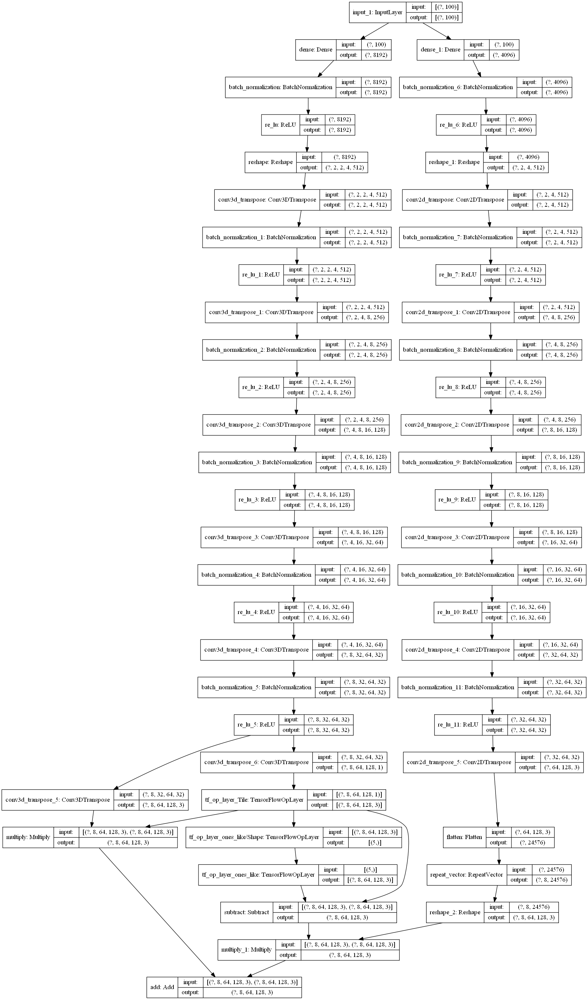

In [15]:
keras.utils.plot_model(vgan_generator, base_output_path + "img/vgan_generator.png", show_shapes=True)

Use the untrained generator to create a test video.


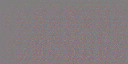

In [16]:
test_noise = tf.random.normal([1, 100])
generated_video = vgan_generator(test_noise, training=False).numpy()

anim_file = base_output_path + "anim/test_noise.gif"
write_gif(anim_file, generated_video[0], fps=5)
embed.embed_file(anim_file)

### The Discriminator

The discriminator is a CNN-based video classifier, using `tf.keras.layers.Conv3D` to downsample/encode the input video to a binary output; real or fake. Discriminating between real and synthetically created videos requires this model to be able to understand motion between frames. Thus, the model by Vondrick et al. [\[1\]](http://www.cs.columbia.edu/~vondrick/tinyvideo/) is the reverse of the foreground generator stream, being a stack of strided spatio-temporal convolutions.

Parameters are similar to the ones described by Vondrick et al.; see figure below for the general idea. In the original paper and their [code](https://github.com/cvondrick/videogan), the following other parameters were set:
- All weights are initialized with Gaussian noise (`mean=0`, `sd=0.01`).
- The strided convolutions use a kernel size of `4` and stride size of `2`. The final convolution uses a kernel size of `2x4x4`
- After every convolutional layer, batch normalization and LeakyReLU activation functions are applied. The first layer does not use batch normalization.

![discriminator](http://www.cs.columbia.edu/~vondrick/tinyvideo/discriminator.png)

As with the generator, several changes were made to accommodate the different format in data (instead of `32x64x64`, the shape of the space is `8x64x128`):
- One additional downsampling layer (3D convolution) is added to the model.
- For the final layer, a dense layer with one unit produces the classification result.
- The size of the time dimension is only halved every second layer (stride of `1x2x2` when not downsampling time in current step).
- Videos are downsampled from `8x64x128` to `2x2x4`.
- The strided convolutions use a kernel size of `3` instead of `4` because even kernels lead to distortions. This is applied on all convolutional layers.

In addition, for the layers that use (Leaky) ReLU activation functions, the weight initialization was changed to `tf.keras.initializers.HeNormal` instead of `tf.keras.initializers.GlorotUniform`. This helps with the quality and the convergence speed [\[2\]](https://www.cv-foundation.org/openaccess/content_iccv_2015/html/He_Delving_Deep_into_ICCV_2015_paper.html).

In [17]:
def make_discriminator_model() -> keras.Model:
    inputs: tf.Tensor = keras.Input(shape=(8, 64, 128, 3))

    x: tf.Tensor = layers.Conv3D(filters=32, kernel_size=3, strides=(1, 2, 2),
                               padding="same", use_bias=False, kernel_initializer="he_normal")(inputs)
    assert x.shape.as_list() == [None, 8, 32, 64, 32]
    x = layers.LeakyReLU()(x)

    x = layers.Conv3D(filters=64, kernel_size=3, strides=2,
                               padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 4, 16, 32, 64]
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv3D(filters=128, kernel_size=3, strides=(1, 2, 2),
                                 padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 4, 8, 16, 128]
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv3D(filters=256, kernel_size=3, strides=2,
                                 padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 2, 4, 8, 256]
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv3D(filters=512, kernel_size=3, strides=(1, 2, 2),
                                 padding="same", use_bias=False, kernel_initializer="he_normal")(x)
    assert x.shape.as_list() == [None, 2, 2, 4, 512]
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    # Get binary classification
    outputs: tf.Tensor = layers.Flatten()(x)
    assert outputs.shape.as_list() == [None, 2 * 2 * 4 * 512]
    outputs = layers.Dense(1)(outputs)
    assert outputs.shape.as_list() == [None, 1]

    return keras.Model(inputs=inputs, outputs=outputs, name="vgan_discriminator")

Create the discriminator model, and check the model summary:

In [18]:
vgan_discriminator = make_discriminator_model()
vgan_discriminator.summary()

Model: "vgan_discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 8, 64, 128, 3)]   0         
_________________________________________________________________
conv3d (Conv3D)              (None, 8, 32, 64, 32)     2592      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 8, 32, 64, 32)     0         
_________________________________________________________________
conv3d_1 (Conv3D)            (None, 4, 16, 32, 64)     55296     
_________________________________________________________________
batch_normalization_12 (Batc (None, 4, 16, 32, 64)     256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 4, 16, 32, 64)     0         
_________________________________________________________________
conv3d_2 (Conv3D)            (None, 4, 8, 16, 12

Display the input and output shapes of each layer as a DAG in a plotted graph:

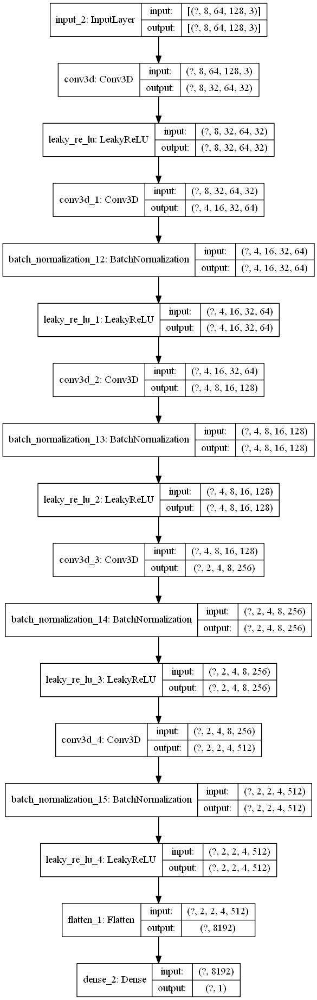

In [19]:
keras.utils.plot_model(vgan_discriminator, base_output_path + "img/vgan_discriminator.png", show_shapes=True)

Use the (as yet untrained) discriminator to classify the generated video as real or fake. The model will be trained to output positive values for real videos, and zero values for fake videos.

In [20]:
decision = vgan_discriminator(generated_video, training=False)
print(decision)

tf.Tensor([[0.0262114]], shape=(1, 1), dtype=float32)


## Define the loss and optimizers

This part is directly taken from the DCGAN implementation by TensorFlow [\[1\]](https://www.tensorflow.org/tutorials/generative/dcgan), because Vondrick et al. use the classic design for adversarial training for their simple generator. Later, when future prediction has to be done, the generator loss term has to be modified, but not at this point in time or in this notebook.

### Cross-Entropy

We do not use an activation function for the final layer in the discriminator model, so we use the binary cross entropy that is more numerical stable, using `from_logits=True`.

In [21]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

This method quantifies how well the discriminator is able to distinguish real videos from generated ones. Real videos have a true label of 1s and fake/generated ones have a true label of 0s, so the comparison between predicted and actual label is computed.

In [22]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss

The generator's loss quantifies how well it was able to trick the discriminator, i.e. generating videos that seem (at that point in the training loop) indistinguishable from real ones, thus they will be classified as real (or 1). Therefore the loss of the generator is directly tied to the one of the discriminator.

In [23]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

The discriminator and the generator optimizers are different since we will train two networks separately. Vondrick et. at all use Adam with a learning rate of `2e-4` and momentum term (`beta1`) of `0.5`

In [24]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)

## Save checkpoints

In [25]:
checkpoint_dir = base_output_path + "training_checkpoints/"
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=vgan_generator,
                                 discriminator=vgan_discriminator)

## Define the training loop

This part is very similar to the DCGAN implementation by TensorFlow [\[1\]](https://www.tensorflow.org/tutorials/generative/dcgan), with only the data being used and displayed being different (video instead of image generation).

In [26]:
EPOCHS = 10
noise_dim = 100
num_examples_to_generate = 16

# Seed is used to display the current progress of the generator model during training
seed = tf.random.normal([num_examples_to_generate, noise_dim])

For each training step, a new random seed is sampled and used as input for the generator to produce a number of videos (BATCH_SIZE). The discriminator has to then classify these videos. In addition a number of real videos (BATCH_SIZE) is also fed to the discriminator to be classified. On the results the loss for both models is calculated, and the models are updated accordingly.

In [27]:
@tf.function
def train_step(batch):
    noise_input = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_videos = vgan_generator(noise_input, training=True)

        real_output = vgan_discriminator(batch, training=True)
        fake_output = vgan_discriminator(generated_videos, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, vgan_generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, vgan_discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, vgan_generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, vgan_discriminator.trainable_variables))

    return gen_loss, disc_loss

In [28]:
gen_train_loss = []
disc_train_loss = []

def train(epochs):
    # Load latest checkpoint if available
    latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
    checkpoint.restore(latest_checkpoint)
    if latest_checkpoint:
        print("Restored from {}".format(latest_checkpoint))
    else:
        print("Initializing from scratch.")

    for epoch in range(epochs):
        # Init batch loader for this epoch
        batch_loader = BatchLoader(uniform_sampler, max_queue_size=128, no_workers=4)

        # Init storage for losses of current epoch
        gen_epoch_loss = []
        disc_epoch_loss = []

        start = time.time()

        # Train models over the entire batch each epoch
        for _ in range(len(batch_loader)):
            batch = batch_loader.get_batch()[1]
            gen_batch_loss, disc_batch_loss = train_step(batch)
            gen_epoch_loss.append(gen_batch_loss)
            disc_epoch_loss.append(disc_batch_loss)

        # Store loss of epoch for summary after training
        gen_train_loss.append(tf.math.reduce_mean(tf.convert_to_tensor(gen_epoch_loss)))
        disc_train_loss.append(tf.math.reduce_mean(tf.convert_to_tensor(disc_epoch_loss)))

        # Produce this epoch's generated videos from the fixed seed
        display.clear_output(wait=True)
        generate_and_save_videos(vgan_generator, epoch + 1, seed)

        # Save the model every 2 epochs
        if (epoch + 1) % 2 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))

        # Cleanup
        batch_loader.shutdown_workers()

    # Generate the last epoch's video from the fixed seed
    display.clear_output(wait=True)
    generate_and_save_videos(vgan_generator, epochs, seed)

## Generate and save videos

In [29]:
anim_file_dir = base_output_path + "anim/train/"

def generate_and_save_videos(model, epoch, test_input):
    predictions = model(test_input, training=False).numpy()

    anim_grid = anim_file_dir + "anim_at_epoch_{:04d}.gif".format(epoch)
    write_gif_grid(anim_grid, predictions, fps=5, dpi=600)

## Train the model

Call the `train()` method defined above to train the generator and discriminator simultaneously. It is important to note however, that generator and discriminator do not overpower each other (else one of them will run into a dead end regarding improvement, causing the other one to be stuck as well).

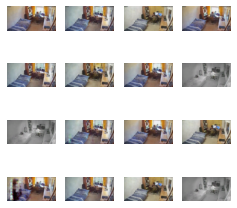

In [30]:
train(EPOCHS)

### Output training losses

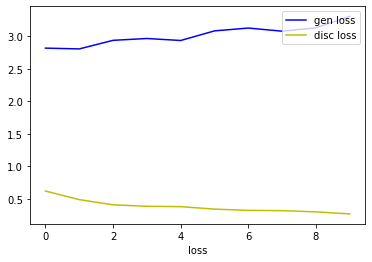

In [36]:
epochs_arr = np.arange(EPOCHS)
gen_loss_arr = np.asarray(gen_train_loss)
disc_loss_arr = np.asarray(disc_train_loss)

training_loss = base_output_path + "img/training_loss.png"

plt.plot(epochs_arr, gen_loss_arr, "b", label="gen loss")
plt.plot(epochs_arr, disc_loss_arr, "y", label="disc loss")
plt.xlabel("epochs")
plt.xlabel("loss")
plt.legend(loc="upper right")

plt.savefig(training_loss)
plt.show()

In [ ]:
print("Generator training loss per epoch:",
      "\t" + str(gen_loss_arr))
print("Discriminator train loss per epoch:",
      "\t" + str(disc_loss_arr))

## Display any of the generated videos


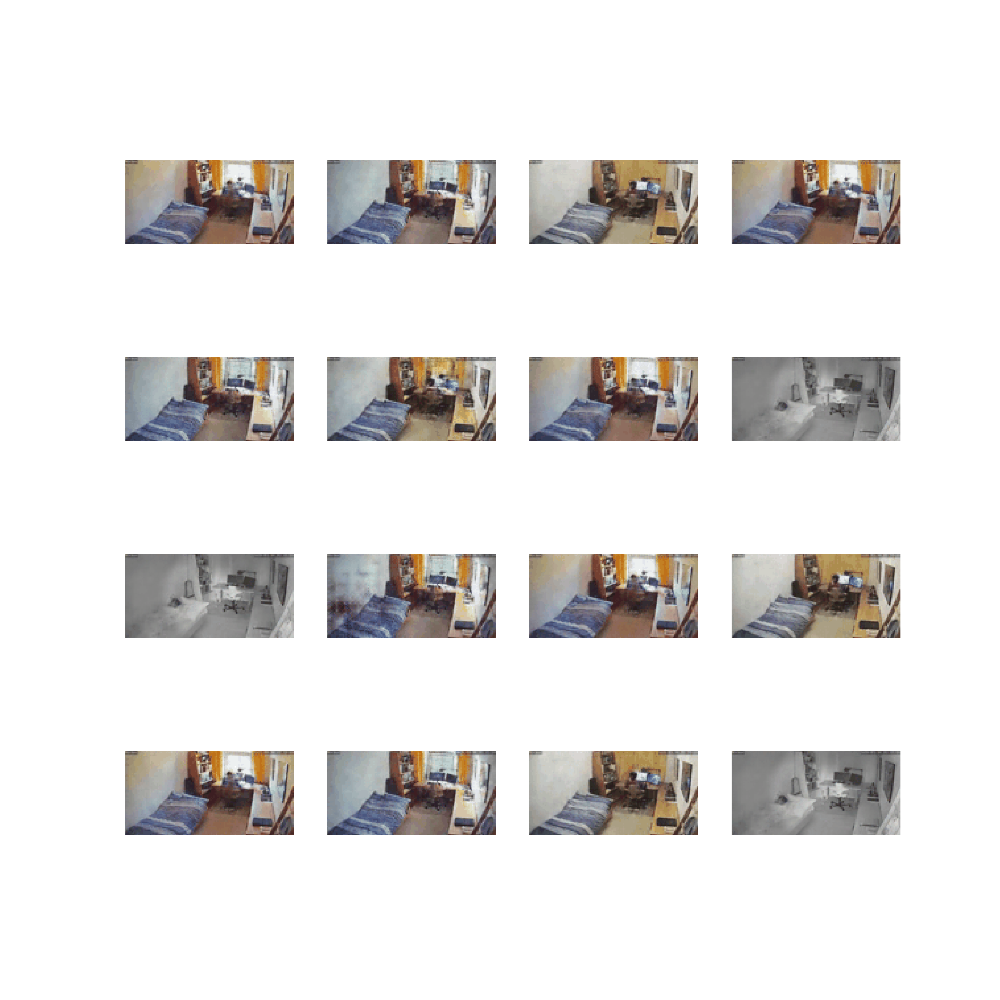

In [33]:
epoch_no = EPOCHS

embed.embed_file(anim_file_dir + "anim_at_epoch_{:04d}.gif".format(epoch_no))